In [14]:
import meds
import fitsio
import proplot as pplt
import subprocess
import glob
import os
import numpy as np


In [33]:
def _download_tile(tilename, cwd):
    os.system("mkdir -p data")

    d = fitsio.read(
        os.path.join(cwd, "fnames.fits"),
        lower=True,
    )
    tnames = np.array([
        d["filename"][i].split("_")[0]
        for i in range(d.shape[0])
    ])
    msk = tnames == tilename
    if np.sum(msk) != 4:
        return np.sum(msk)

    d = d[msk]
    mfiles = []
    for band in ["g", "r", "i", "z"]:
        msk = d["band"] == band
        if np.any(msk):
            _d = d[msk]
            for i in range(len(_d)):
                fname = os.path.join(d["path"][msk][i], d["filename"][msk][i])
                cmd = """\
        rsync \
                -av \
                --password-file $DES_RSYNC_PASSFILE \
                ${DESREMOTE_RSYNC_USER}@${DESREMOTE_RSYNC}/%s \
                ./data/%s
        """ % (fname, os.path.basename(fname))
                subprocess.run(cmd, shell=True, check=True)
            mfiles.append("./data/%s" % os.path.basename(fname))

    return mfiles


In [34]:
fnames = sorted(glob.glob("./data_final/*.fits"))

In [35]:
find = 10
tilename = os.path.basename(fnames[find]).split("_")[0]
mfiles = _download_tile(tilename, ".")


    DES rsync daemon

receiving incremental file list
DES0001-0624_r5763p01_g_pizza-cutter-slices.fits.fz

sent 42 bytes  received 864856351 bytes  101747810.94 bytes/sec
total size is 864645120  speedup is 1.00

    DES rsync daemon

receiving incremental file list
DES0001-0624_r5763p01_r_pizza-cutter-slices.fits.fz

sent 42 bytes  received 860074383 bytes  101185226.47 bytes/sec
total size is 859864320  speedup is 1.00

    DES rsync daemon

receiving incremental file list
DES0001-0624_r5763p01_i_pizza-cutter-slices.fits.fz

sent 42 bytes  received 824440087 bytes  109925350.53 bytes/sec
total size is 824238720  speedup is 1.00

    DES rsync daemon

receiving incremental file list
DES0001-0624_r5763p01_z_pizza-cutter-slices.fits.fz

sent 42 bytes  received 845823551 bytes  99508658.00 bytes/sec
total size is 845616960  speedup is 1.00


In [36]:
try:
    m.close()
except Exception:
    pass
m = meds.MEDS(mfiles[2])

In [37]:
d = fitsio.read(fnames[find])

In [61]:
msk = (
    (d["flags"] == 0)
    & (d["mask_flags"] == 0)
    & (d["mdet_s2n"] > 15)
    & (d["mfrac"] < 0.02)
    & (d["mdet_T_ratio"] > 0.5)
    & (d["mdet_T"] > 0.95)
    & (d["mdet_T"] < 1)
    & (d["mdet_step"] == "noshear")
)
dsel = d[msk]
np.sum(msk)

32

53.489586147004346
17.659986548334988
533.909837508597
33.371049273539874
60.49995302810304
19.79916609018128
15.346252542556607
1148.308018349308
422.2998352867162
181.9462487373964
22.826483904215646
35.20554478015329
28.56431143042498
19.01454560606222
600.2332000056188
19.055311269370396
27.240334178661882
82.07741167722997
17.90417356562074
373.6334303197
16.739473590275292


/gpfs02/astro/workarea/beckermr/miniconda3/envs/desy6/lib/python3.9/site-packages/proplot/ui.py:143: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  return plt.figure(FigureClass=pfigure.Figure, **kwargs)


105.86597757916476
23.08028634992935
34.14252916185326
21.748284902543755
17.668802605942403
37.78481719741403
18.860382258507265
28.910762314160745
18.187081160136376
17.6780037395663
15.504697380207011


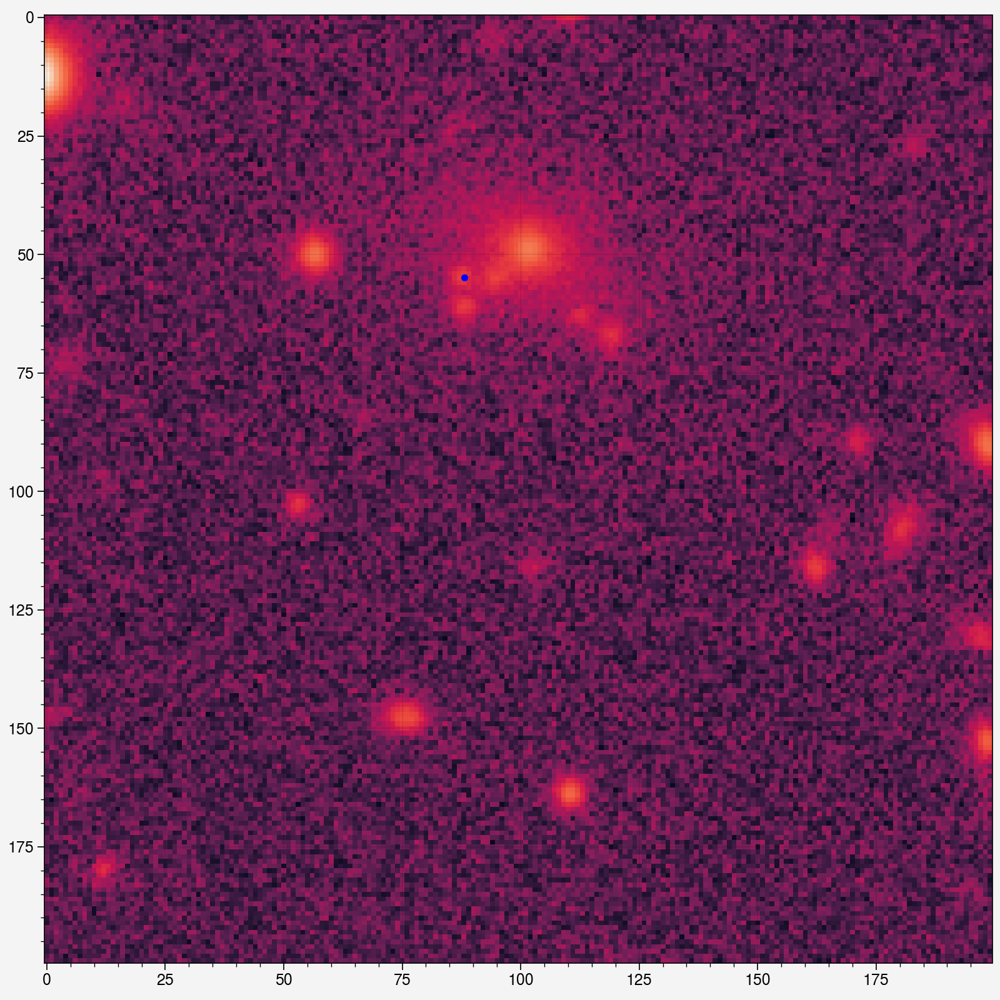

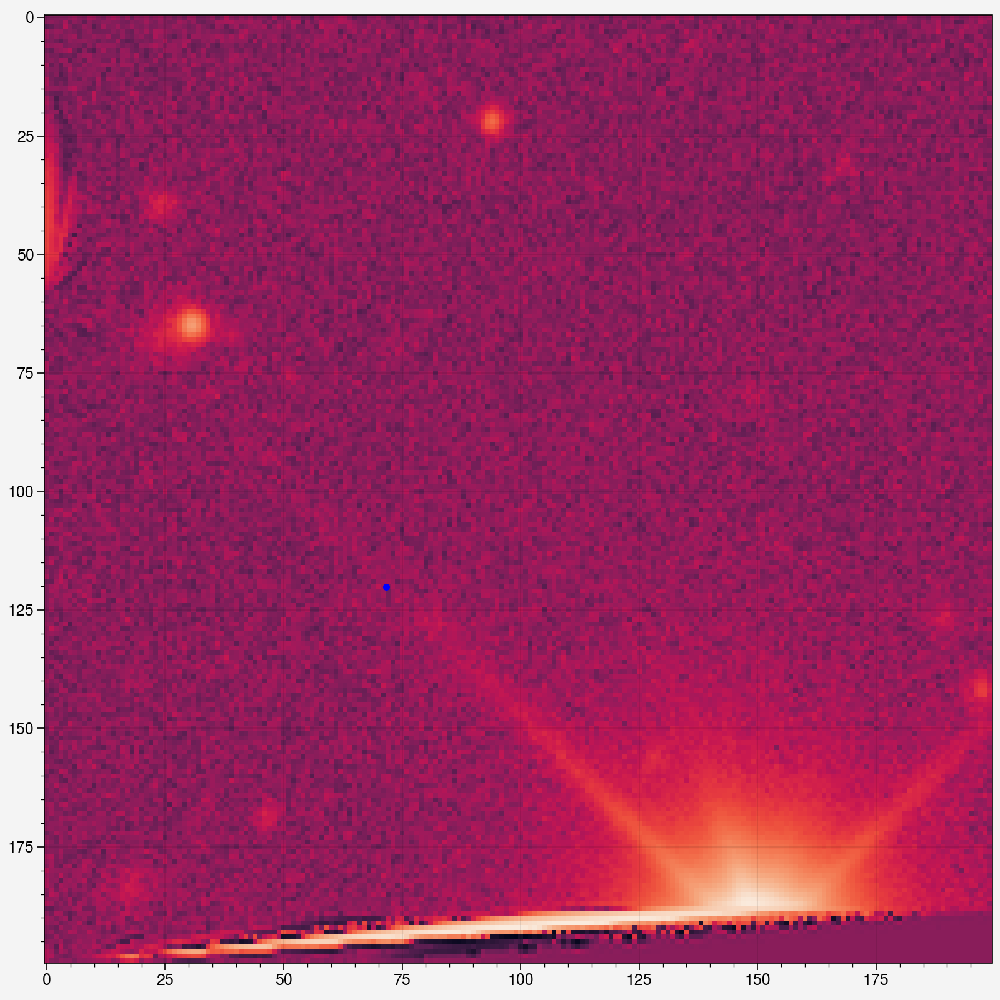

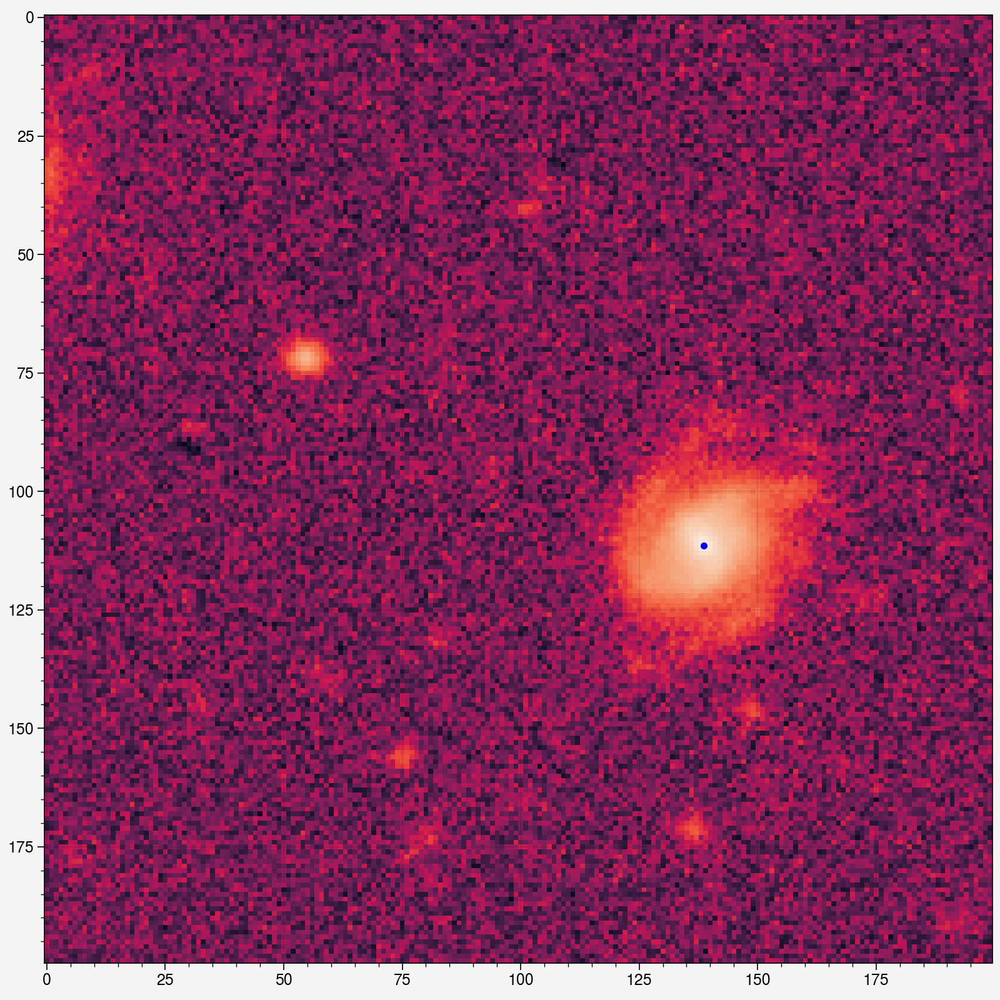

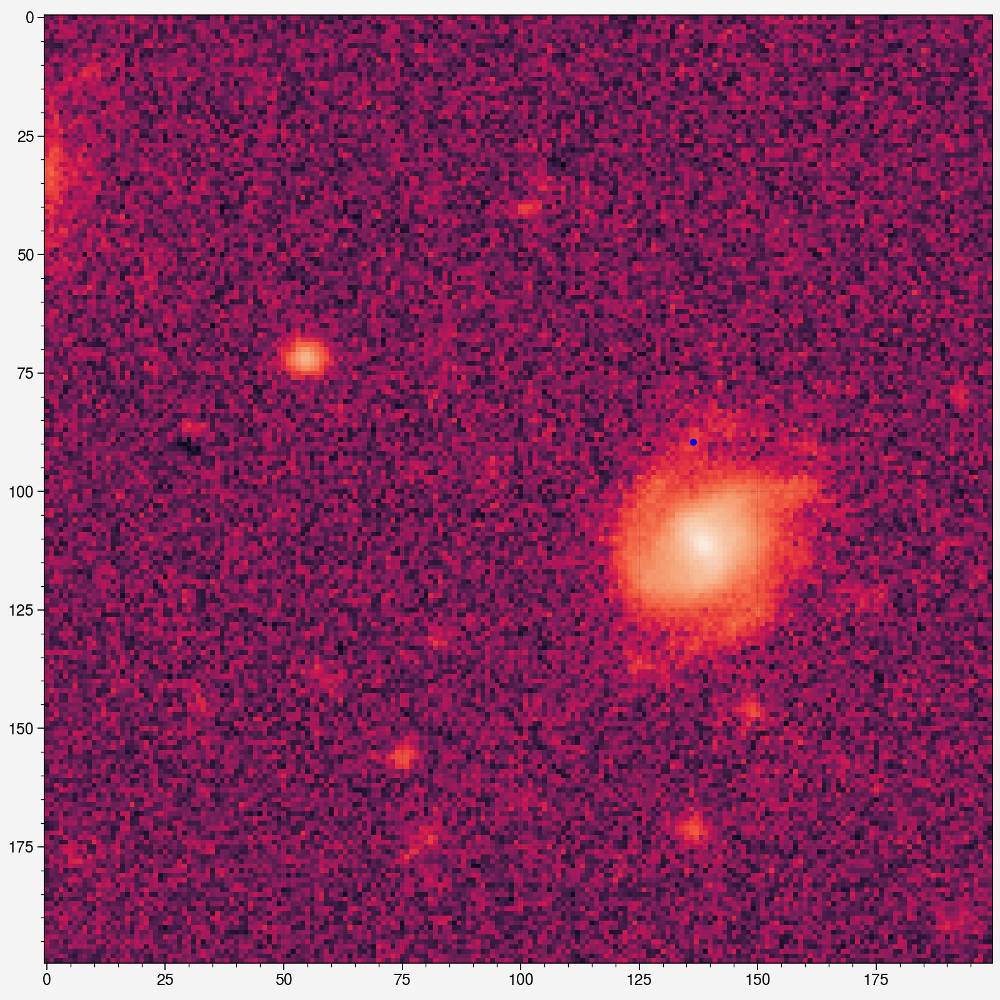

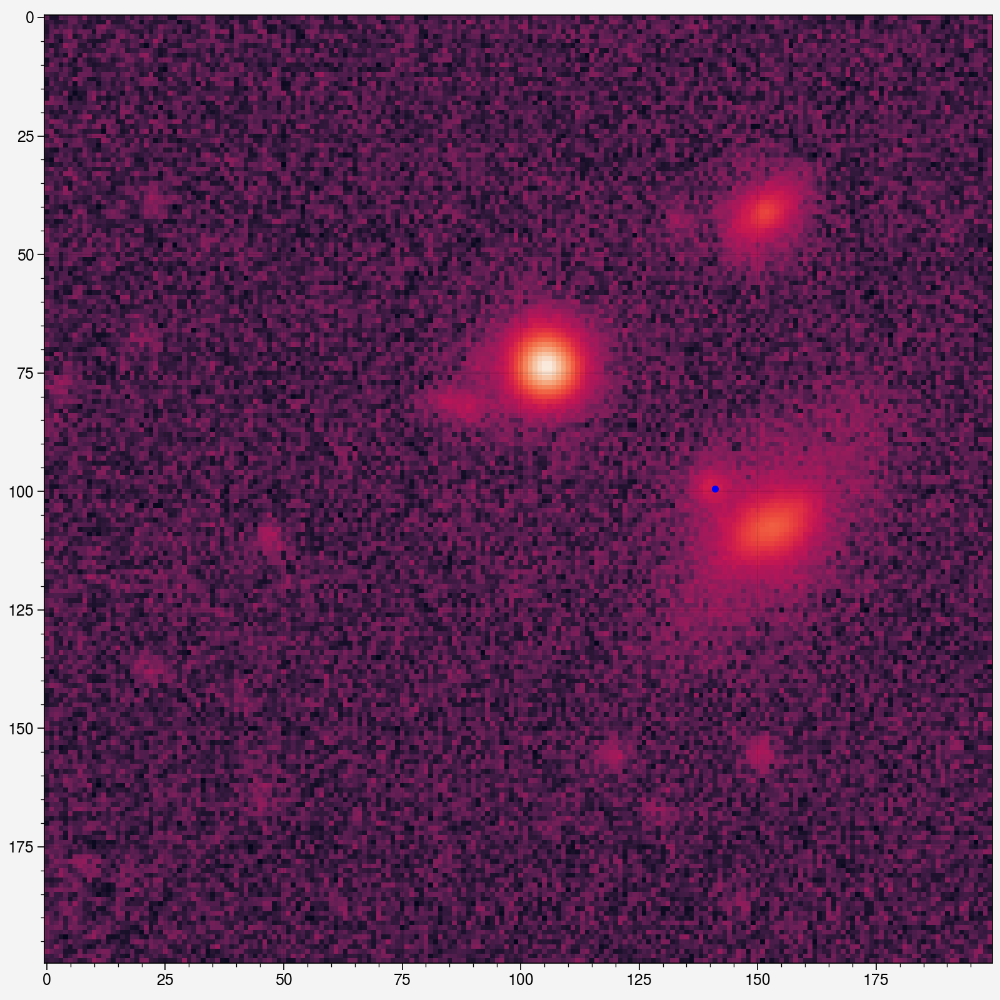

...

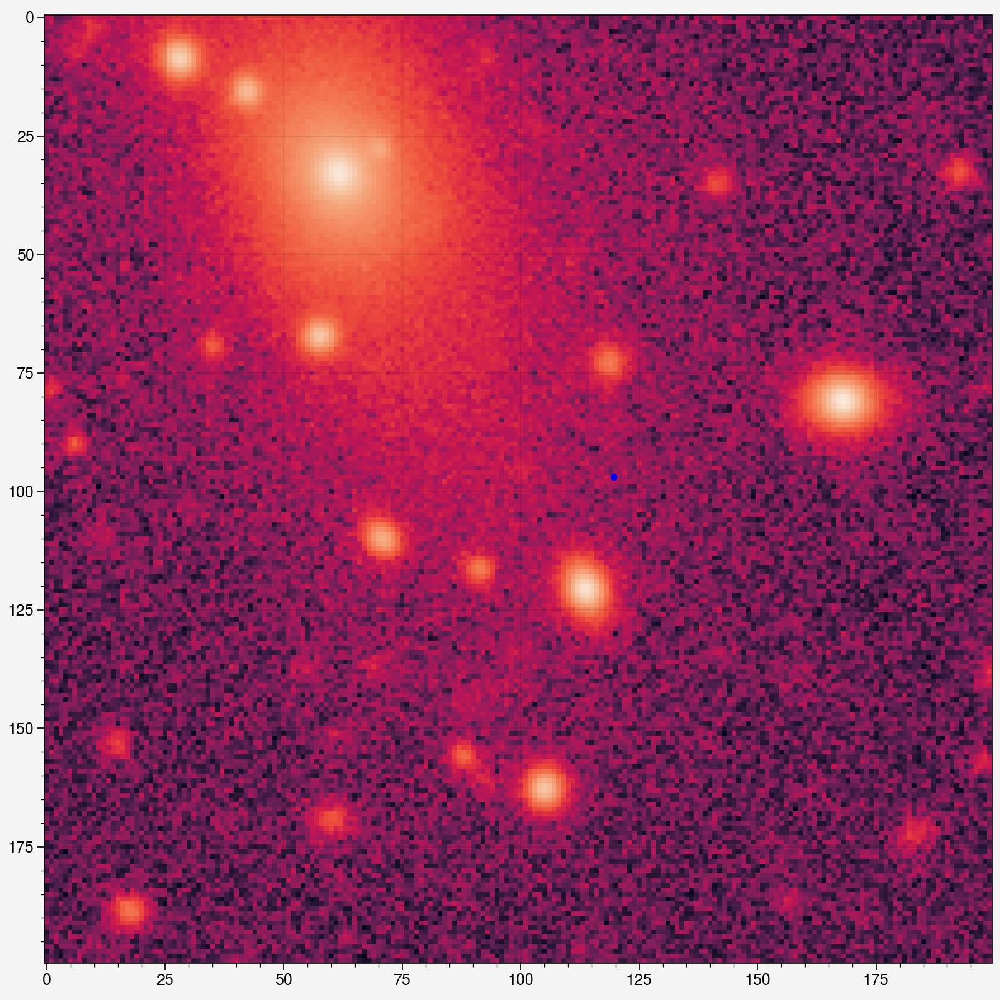

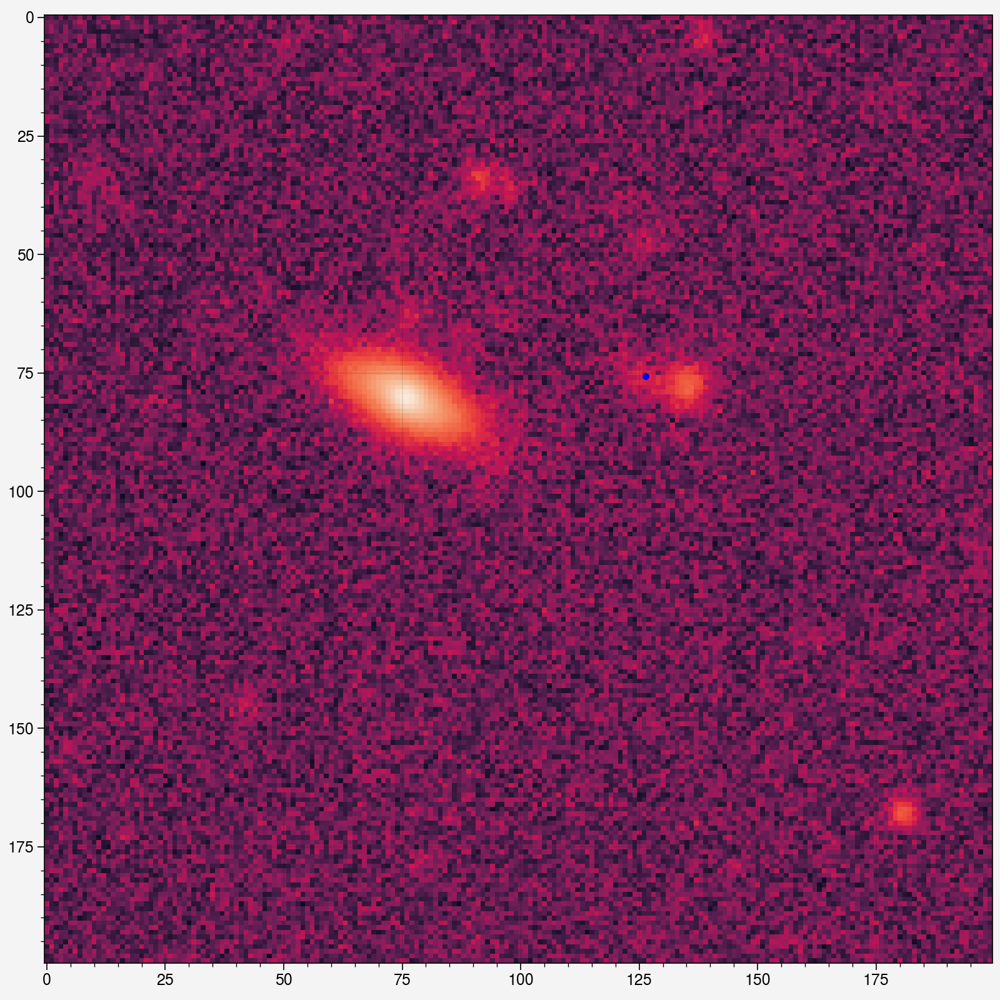

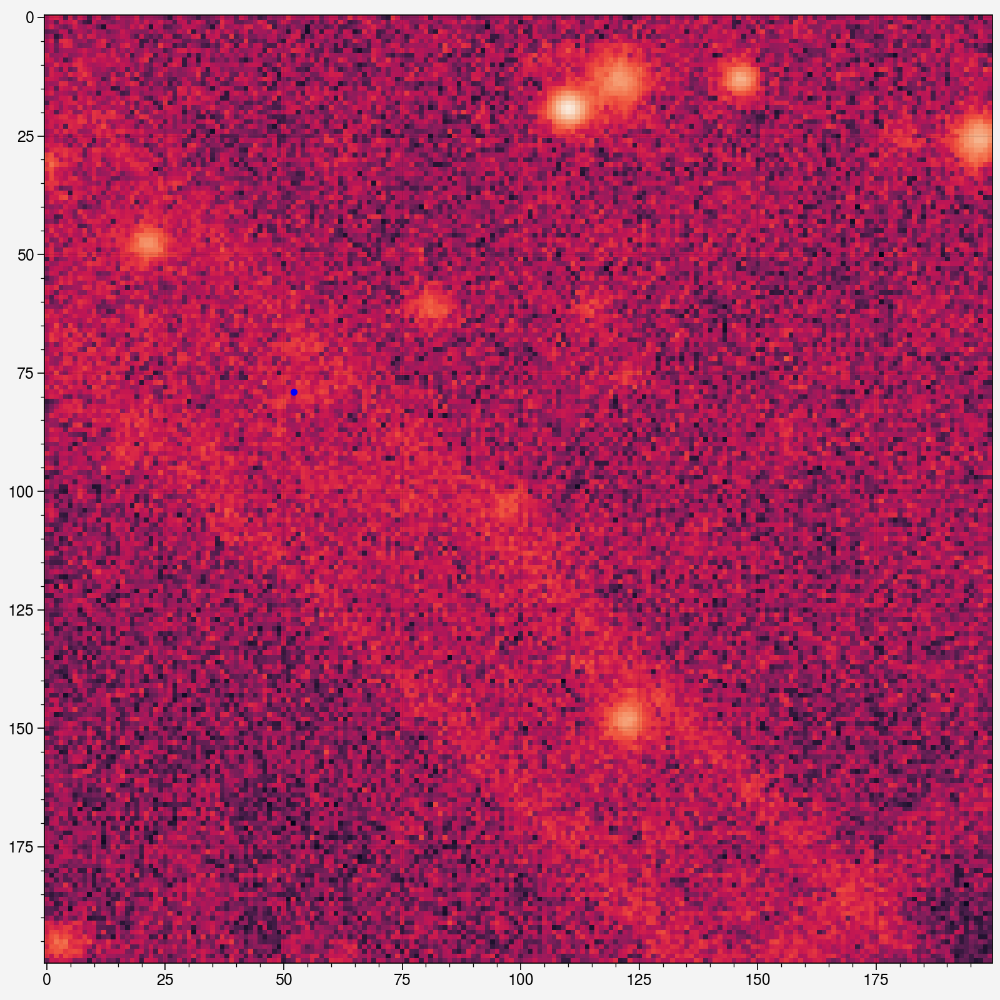

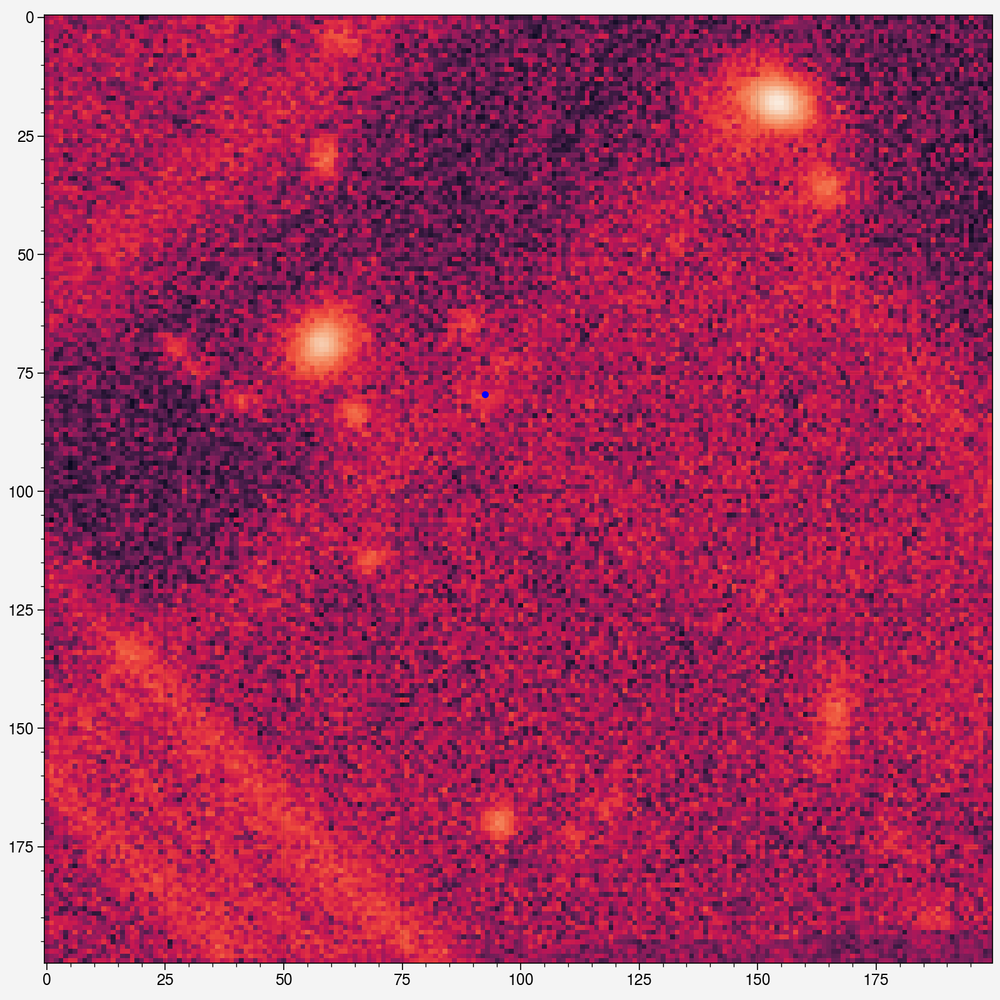

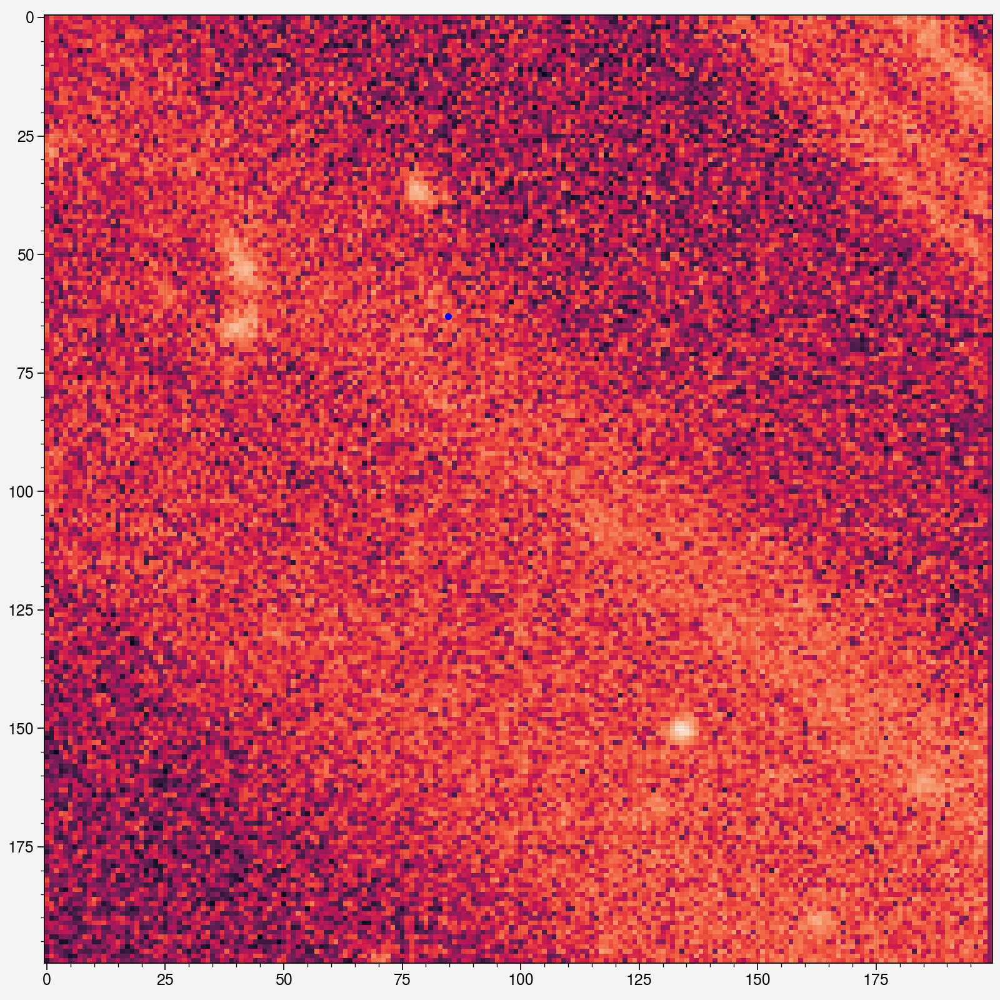

In [63]:
for i in range(dsel.shape[0]):
    sid = dsel["slice_id"][i]
    im = m.get_cutout(sid, 0)
    wgt = m.get_cutout(sid, 0, type="weight")
    fig, axs = pplt.subplots(figsize=(8, 8))
    axs.imshow(np.arcsinh(im * np.sqrt(np.median(wgt))), cmap="rocket")
    axs.plot(dsel["slice_x"][i], dsel["slice_y"][i], "b.")
    print(dsel["mdet_s2n"][i])


In [65]:
msk = (
    (d["flags"] == 0)
    & (d["mask_flags"] == 0)
    & (d["mdet_s2n"] > 10)
    & (d["mfrac"] < 0.02)
    & (d["mdet_T_ratio"] > 0.5)
    & (d["mdet_T"] < 1)
    & (d["mdet_step"] == "noshear")
)
np.mean(msk), np.sum(msk)

(0.036629469160948204, 14423)

In [66]:
np.sum(msk) * 1e4/1e6

144.23